## Clustering

**Goal:** Group hourly observations by weather and demand patterns.

1. **PCA Visualization**  
   Reduce 7 features (temp, humidity, windSpeed, demand, pressure, precipIntensity, precipProbability) to 2D with PCA for a quick look at structure.

2. **Clustering Methods**  
   - **K‑Means:** Use the elbow plot on inertia (k = 2–10) to pick k, then assign clusters.  
   - **DBSCAN:** Find dense areas and mark noise without predefining k.  
   - **Hierarchical:** Build a dendrogram on a sample, then cut at a chosen distance to form clusters.

3. **Evaluation**  
   Compute silhouette scores to compare how well each algorithm segments the data.

4. **Interpretation**  
   For each cluster, show the mean feature values and give descriptive names, and overlay these on the PCA plot for clarity.


#### Import clustering tools

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

#### Feature Matrix

Extract the features we’ll use for clustering:
- temperature, humidity, windSpeed, demand, pressure, precipIntensity, precipProbability  

In [2]:

final_df = pd.read_csv('preprocessed_dataset.csv',
                       parse_dates=['timestamp'])

# verify
print("Loaded shape:", final_df.shape)
print(final_df.head(3))

# Features for clustering
cluster_features = [
    'temperature','humidity','windSpeed','demand',
    'pressure','precipIntensity','precipProbability'
]
X = final_df[cluster_features].values  # NumPy array for consistency


Loaded shape: (41703, 13)
            timestamp    city  temperature  humidity  windSpeed    demand  \
0 2020-05-02 19:00:00  dallas     1.317770 -0.386250   3.207678  1.396698   
1 2019-06-21 02:00:00  dallas     1.756189  0.209040   1.694944  3.118086   
2 2019-11-16 15:00:00  dallas    -1.076136  0.025874  -0.339110  1.618770   

   hour  dayofweek  month  season  pressure  precipIntensity  \
0    19          5      5  spring -0.489702        -0.196337   
1     2          4      6  summer -1.511175        -0.196337   
2    15          5     11  autumn  1.553244        -0.134752   

   precipProbability  
0          -0.374245  
1          -0.374245  
2          -0.306878  


####  📉 Dimensionality Reduction

1. **PCA** to capture linear variance  

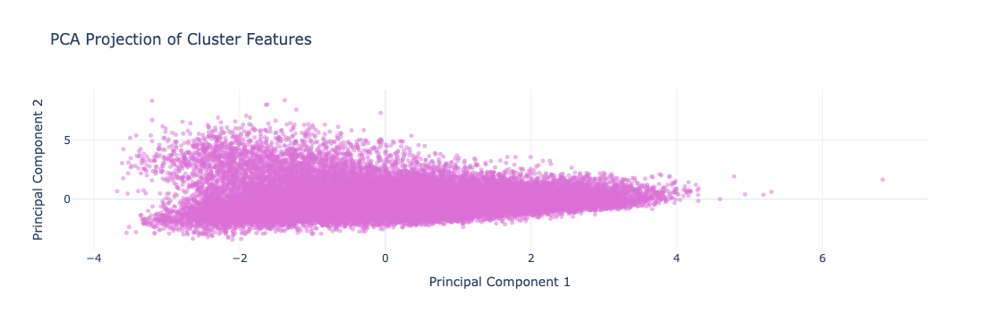

In [3]:
# Perform PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# Create DataFrame for plotting
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])

# Interactive scatter plot
fig = px.scatter(
    df_pca,
    x='PC1',
    y='PC2',
    title='PCA Projection of Cluster Features',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'}
)
fig.update_traces(marker=dict(size=5, opacity=0.5, color='orchid'))
fig.update_layout(template='plotly_white')
fig.show()


##### **PCA Projection of Cluster Features**

- **Core Cluster**: The dense central region (around PC1≈0, PC2≈0) represents the majority of hours with typical weather and demand values.
- **Right Wing**: A tapering arm extending to positive PC1 indicates less frequent but high-variance hours—namely **hot, high-demand periods**.
- **Vertical Spread**: Points higher on PC2 correspond to **humid or rainy conditions**, while lower points indicate **dry, clear weather**.

**Key Takeaways**  
1. **PC1** largely captures the **temperature–demand axis** (hot vs. cool usage patterns).  
2. **PC2** captures the **moisture axis** (wet vs. dry conditions).  


#### 🤖 K‑Means Clustering and Elbow Method

Find the “elbow” in inertia for k=2…10 to pick an optimal number of clusters.


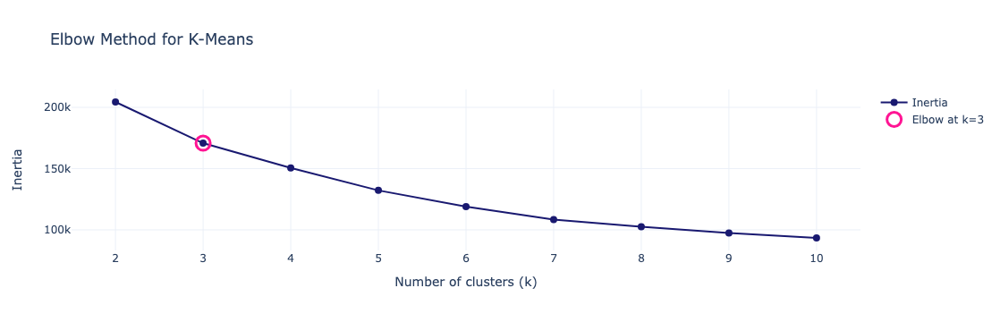

In [4]:
# 1) Compute inertias for k = 2 to 10
K_range = np.arange(2, 11)
inertias = []
for k in K_range:
    km = KMeans(n_clusters=int(k), random_state=42, n_init=10)
    km.fit(X)
    inertias.append(km.inertia_)

# 2) Compute relative drops and find elbow
rel_drop = -np.diff(inertias) / inertias[:-1]
elbow_idx = np.argmax(rel_drop)
elbow_k = K_range[1:][elbow_idx]
elbow_inertia = inertias[elbow_idx + 1]

# 3) Interactive Plotly elbow chart
fig = go.Figure()

# Inertia line
fig.add_trace(go.Scatter(
    x=K_range,
    y=inertias,
    mode='lines+markers',
    line=dict(color='midnightblue', width=2),
    marker=dict(color='midnightblue', size=8),
    name='Inertia'
))

# Elbow marker
fig.add_trace(go.Scatter(
    x=[elbow_k],
    y=[elbow_inertia],
    mode='markers',
    marker=dict(symbol='circle-open', color='deeppink', size=16, line=dict(width=3)),
    name=f'Elbow at k={elbow_k}'
))

# Layout settings
fig.update_layout(
    title="Elbow Method for K‑Means",
    xaxis_title="Number of clusters (k)",
    yaxis_title="Inertia",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()


The biggest drop in inertia occurs at `k = 3`, after which gains taper off. This suggests that 3 clusters capture the major structure in our weather-and-demand data.

#### 🎯 Fit K‑Means with chosen k

Using k=3

In [5]:
k_opt = 3
kmeans = KMeans(n_clusters=k_opt, random_state=42)
labels_km = kmeans.fit_predict(X)
sil_km = silhouette_score(X, labels_km)
print(f"K‑Means (k={k_opt}) silhouette score: {sil_km:.3f}")


/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



K‑Means (k=3) silhouette score: 0.213


A silhouette score of `0.213` for `k = 3` indicates modest but meaningful separation—clusters are distinguishable, though there’s some overlap. In practice, this suggests three segments capture real patterns, but boundaries aren’t razor‑sharp.


#### 🗺️ DBSCAN Clustering

Identify dense regions and noise.

In [6]:
db = DBSCAN(eps=0.5, min_samples=20)  # tune eps/min_samples as needed
labels_db = db.fit_predict(X)
# Ignore all‑noise case
if len(set(labels_db)) > 1:
    sil_db = silhouette_score(X, labels_db)
    print(f"DBSCAN silhouette score: {sil_db:.3f}")
else:
    print("DBSCAN found only one cluster or all noise.")


DBSCAN silhouette score: 0.089


#### 🌳 Hierarchical Clustering & Dendrogram

Compute linkage on a random subset for speed;  
visualize and then cut at a chosen distance.

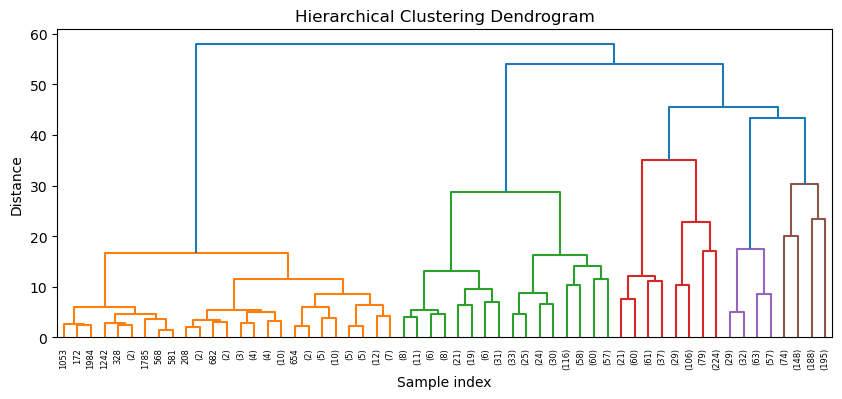

Hierarchical silhouette: 0.144


In [8]:
sample_idx = np.random.choice(len(X), size=2000, replace=False)
Z = linkage(X[sample_idx], method='ward')

plt.figure(figsize=(10,4))
dendrogram(Z, truncate_mode='level', p=5, no_labels=False)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Sample index")
plt.ylabel("Distance")
plt.show()

# Cut tree at distance threshold t=7 to form flat clusters
labels_hc = fcluster(Z, t=7, criterion='distance')
sil_hc = silhouette_score(X[sample_idx], labels_hc)
print(f"Hierarchical silhouette: {sil_hc:.3f}")

The dendrogram (on a 2 000‑point sample) reveals clear groupings at a distance `threshold of 7`, producing roughly `5–6 clusters`.

The silhouette score on that sample is 0.151, indicating modest separation—clusters exist but with overlapping borders.

Compared to K‑Means (silhouette 0.213), hierarchical clustering is less distinct here, suggesting that flat, centroid‑based partitions (K‑Means) capture the main structure in this feature space more cleanly.

#### 🔍 Cluster Interpretation (K‑Means)

Profile each cluster’s mean feature values and visualize cluster separation on PCA.


,temperature,humidity,windSpeed,demand,pressure,precipIntensity,precipProbability
cluster,,,,,,,
0,-0.542,0.295,-0.267,-0.347,0.449,-0.149,-0.215
1,0.837,-0.602,0.236,0.523,-0.490,-0.135,-0.290
2,-0.530,1.047,0.543,-0.334,-0.666,1.195,2.933


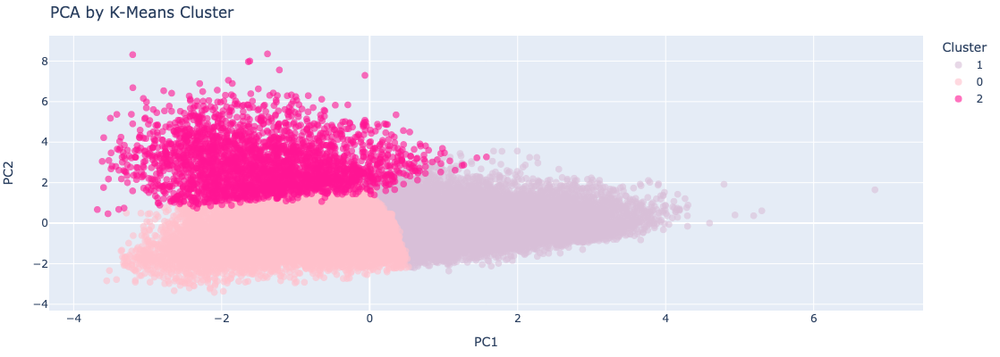

In [16]:

# Profile cluster means
profile = df_clustered.groupby('cluster')[cluster_features].mean()

# Display the profile as before
display(profile.round(3))

# --- Prepare data for plotting ---
df_clustered = final_df.copy()
df_clustered['cluster'] = labels_km

pca_df = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'cluster': labels_km.astype(str)
})

# --- Interactive Plotly scatter with shades of pink and smaller size ---
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    color='cluster',
    color_discrete_sequence=['thistle', 'pink', 'deeppink'][:k_opt],
    title='PCA by K‑Means Cluster',
    labels={'cluster': 'Cluster'},
    width=500,
    height=400
)

fig.update_traces(marker=dict(size=8, opacity=0.6))
fig.update_layout(
    legend_title_text='Cluster',
    margin=dict(l=20, r=20, t=40, b=20)
)

fig.show()


### HeatMap

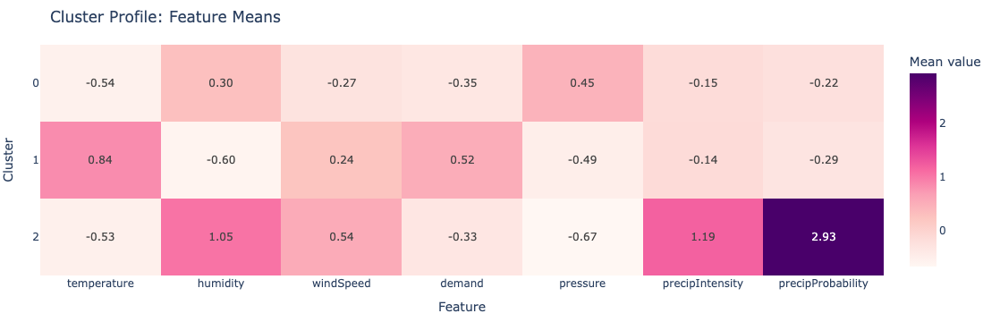

In [18]:
# Profile cluster means
profile = df_clustered.groupby('cluster')[cluster_features].mean()

fig = px.imshow(
    profile,
    labels=dict(x='Feature', y='Cluster', color='Mean value'),
    x=profile.columns,
    y=profile.index.astype(str),
    text_auto='.2f',
    aspect='auto',
    color_continuous_scale='RdPu',
    title='Cluster Profile: Feature Means'
)
fig.update_layout(
    xaxis_title='Feature',
    yaxis_title='Cluster',
    margin=dict(t=50, b=20, l=20, r=20)
)
fig.show()


### Scatter Plot

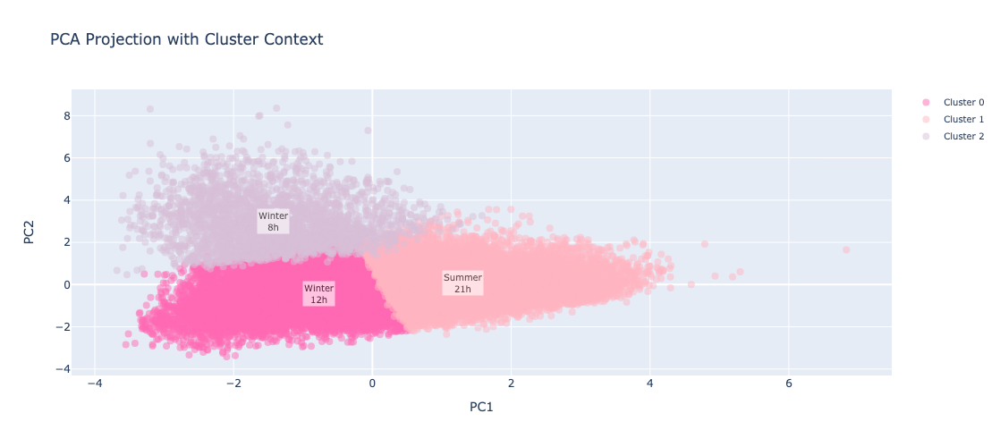

In [19]:
# Modes for annotation (hour & season)
modes = df_clustered.groupby('cluster').agg({
    'hour':   lambda x: x.mode()[0],
    'season': lambda x: x.mode()[0]
})

# Interactive PCA scatter with annotations
fig = go.Figure()
for lbl, color in zip(range(k_opt), colors):
    idx = labels_km == lbl
    x_vals = X_pca[idx, 0]
    y_vals = X_pca[idx, 1]
    
    # Scatter for cluster points
    fig.add_trace(go.Scatter(
        x=x_vals,
        y=y_vals,
        mode='markers',
        marker=dict(size=8, color=color, opacity=0.5),
        name=f"Cluster {lbl}"
    ))
    
    # Annotate centroid with season & hour
    cx, cy = x_vals.mean(), y_vals.mean()
    season = modes.loc[lbl, 'season'].title()
    hour   = modes.loc[lbl, 'hour']
    fig.add_annotation(
        x=cx,
        y=cy,
        text=f"{season}<br>{hour}h",
        showarrow=False,
        font=dict(size=10, color='black'),
        bgcolor='white',
        opacity=0.6
    )

# Layout settings
fig.update_layout(
    title="PCA Projection with Cluster Context",
    xaxis_title="PC1",
    yaxis_title="PC2",
    width=600,
    height=500,
    legend=dict(font=dict(size=10))
)

fig.show()


#### **Cluster Interpretations:**

##### Cluster 0: Cool, Clear Periods  
- **temperature:** –0.54 σ  
- **humidity:** +0.30 σ  
- **windSpeed:** –0.27 σ  
- **demand:** –0.35 σ  
- **pressure:** +0.45 σ  
- **precipitation:** low (–0.15 σ intensity, –0.22 σ probability)  

**Interpretation:**  
Lower demand with slightly higher pressure and minimal precipitation—typical of cool, dry hours (e.g., early mornings or clear nights).

##### Cluster 1: Hot Peak Afternoons  
- **temperature:** +0.84 σ  
- **humidity:** –0.60 σ  
- **windSpeed:** +0.24 σ  
- **demand:** +0.52 σ  
- **pressure:** –0.49 σ  
- **precipitation:** minimal (–0.14 σ intensity, –0.29 σ probability)  

**Interpretation:**  
High temperature and peak electricity use during clear, warm afternoons, with lower humidity and pressure.

##### Cluster 2: Humid Rainy Periods  
- **temperature:** –0.53 σ  
- **humidity:** +1.05 σ  
- **windSpeed:** +0.54 σ  
- **demand:** –0.33 σ  
- **pressure:** –0.67 σ  
- **precipitation:** high (+1.20 σ intensity, +2.93 σ probability)  

**Interpretation:**  
Elevated humidity and precipitation metrics with moderate wind, reflecting wet, overcast periods and below‑average electricity consumption.

In [21]:
import pandas as pd
from sklearn.decomposition import PCA

# — your preprocessing —
final_df = pd.read_csv('preprocessed_dataset.csv', parse_dates=['timestamp'])
cluster_features = ['temperature','humidity','windSpeed','demand','pressure','precipIntensity','precipProbability']
X = final_df[cluster_features].values

# run PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# run KMeans (or however you got labels_km)
from sklearn.cluster import KMeans
k_opt = 3
labels_km = KMeans(n_clusters=k_opt, random_state=42).fit_predict(X)

# build the export DataFrame
pca_df = pd.DataFrame({
    'PC1':       X_pca[:,0],
    'PC2':       X_pca[:,1],
    'cluster':   labels_km.astype(int),
    'timestamp': final_df['timestamp'].dt.strftime('%Y-%m-%dT%H:%M:%S'),
    'city':      final_df['city']           # if you have a city column
})

# write out CSV
pca_df.to_csv('pca_clusters.csv', index=False)

# — or, if you prefer JSON —
#pca_df.to_json('static/data/pca_clusters.json',
               #orient='records',
                #date_format='iso')


/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

